<a href="https://colab.research.google.com/github/GabrielaRomoM/DIP-2024-2/blob/main/FiltrosPT1_291124.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Datos

In [ ]:
def load_data(FILEID):
    #FILEID es la identificación de un archivo .zip en mi drive con permisos para cualquiera que posea el ID
    ## dicho ID se encuentra en celdas más abajo.
    #Se carga, descomprime y finalmente guarda en la variable Data el conjunto de datos.
    !wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id='$FILEID -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id="$FILEID -O parches.zip && rm -rf /tmp/cookies.txt
    !unzip parches.zip
    !dir
    #Data=df.read_csv('/content/UpdatedResumeDataSet.csv')

In [ ]:
load_data('1MNxr-FFnz2RIurEpQgQg6m377DdqsZZY')

--2024-11-29 14:49:01--  https://docs.google.com/uc?export=download&confirm=&id=1MNxr-FFnz2RIurEpQgQg6m377DdqsZZY
Resolving docs.google.com (docs.google.com)... 173.194.79.101, 173.194.79.113, 173.194.79.100, ...
Connecting to docs.google.com (docs.google.com)|173.194.79.101|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1MNxr-FFnz2RIurEpQgQg6m377DdqsZZY&export=download [following]
--2024-11-29 14:49:01--  https://drive.usercontent.google.com/download?id=1MNxr-FFnz2RIurEpQgQg6m377DdqsZZY&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 108.177.119.132, 2a00:1450:4013:c00::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|108.177.119.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 18197214 (17M) [application/octet-stream]
Saving to: ‘parches.zip’

parches.zip         100%[===================>]  17.35M  --.-K

# Libreria

In [ ]:
%matplotlib inline
from PIL import Image
from PIL import Image, ImageFilter
from skimage import filters, feature, img_as_float, data
from skimage.color import rgb2gray
from skimage.transform import rescale
from skimage.io import imread, imshow, show
from skimage.util import random_noise
from skimage.filters import gaussian
from skimage.filters import laplace
from scipy import ndimage, misc, signal
import matplotlib.pylab as pylab
import matplotlib.pyplot as plt
import scipy.fftpack as fp
import numpy as np
import numpy.fft
import timeit

# Gradientes

1.0 -1.0 -0.003003003003003003
1.0 -1.0 -0.002890173410404624


<ipython-input-33-94950387030f>:12: RuntimeWarning: divide by zero encountered in divide
  im_dir = np.arctan(im_y/im_x)
<ipython-input-33-94950387030f>:12: RuntimeWarning: invalid value encountered in divide
  im_dir = np.arctan(im_y/im_x)


<Figure size 640x480 with 0 Axes>

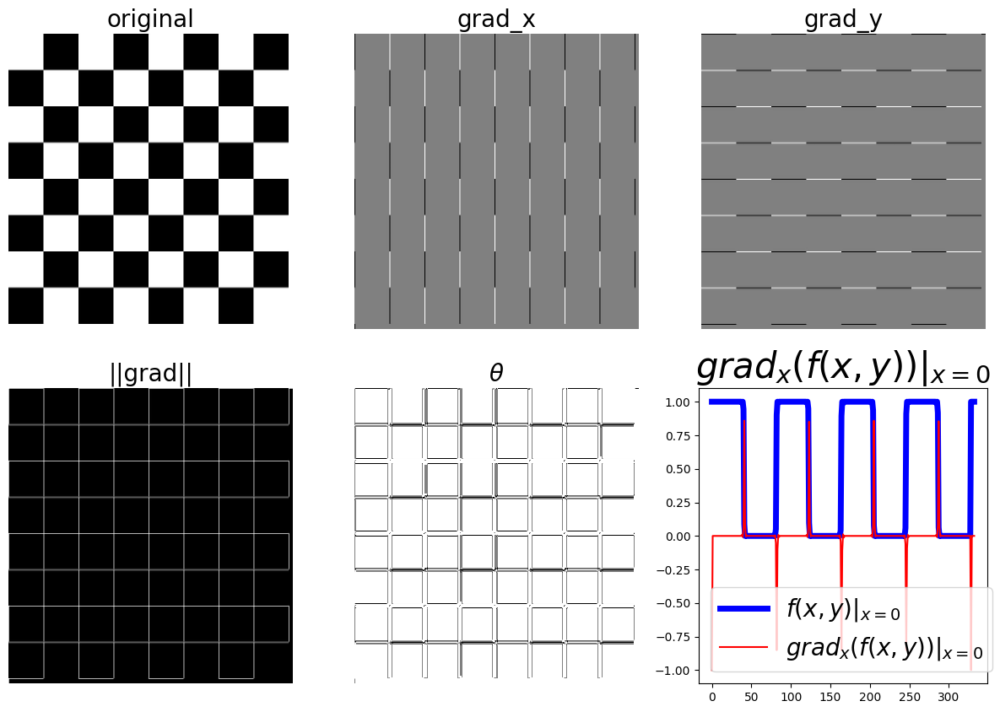

In [ ]:
def plot_image(image, title):
    pylab.imshow(image), pylab.title(title, size=20), pylab.axis('off')
path = '/content/images/'
ker_x = [[-1, 1]]
ker_y = [[-1], [1]]
im = rgb2gray(imread(path + 'chess.png')[:, :, 0:3])
im_x = signal.convolve2d(im, ker_x, mode='same')
im_y = signal.convolve2d(im, ker_y, mode='same')
print(im_x.max(),im_x.min(),im_x.mean())
print(im_y.max(),im_y.min(),im_y.mean())
im_mag = np.sqrt(im_x**2 + im_y**2)
im_dir = np.arctan(im_y/im_x)
pylab.gray()
pylab.figure(figsize=(15,10))
pylab.subplot(231), plot_image(im, 'original'), pylab.subplot(232),
plot_image(im_x, 'grad_x')
pylab.subplot(233), plot_image(im_y, 'grad_y'), pylab.subplot(234),
plot_image(im_mag, '||grad||')
pylab.subplot(235), plot_image(im_dir, r'$\theta$'), pylab.subplot(236)
pylab.plot(range(im.shape[1]), im[0,:], 'b-', label=r'$f(x,y)|_{x=0}$', linewidth=5)
pylab.plot(range(im.shape[1]), im_x[0,:], 'r-', label=r'$grad_x (f(x,y))|_{x=0}$')
pylab.title(r'$grad_x (f(x,y))|_{x=0}$', size=30)
pylab.legend(prop={'size': 20})
pylab.show()

1.0


<ipython-input-36-d451cc7723b2>:8: RuntimeWarning: divide by zero encountered in divide
  im_ang = np.arctan(im_y/im_x)
<ipython-input-36-d451cc7723b2>:8: RuntimeWarning: invalid value encountered in divide
  im_ang = np.arctan(im_y/im_x)


<Figure size 640x480 with 0 Axes>

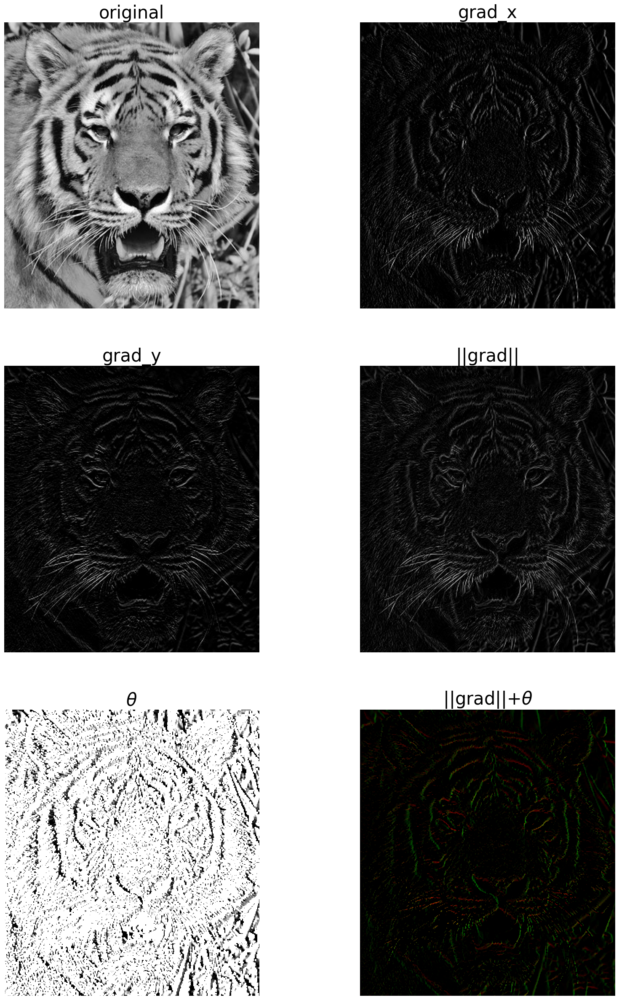

In [ ]:
ker_x = [[-1, 1]]
ker_y = [[-1], [1]]
im = rgb2gray(imread(path+'tiger3.jpg'))
print(np.max(im))
im_x = np.clip(signal.convolve2d(im, ker_x, mode='same'),0,1)
im_y = np.clip(signal.convolve2d(im, ker_y, mode='same'),0,1)
im_mag = np.sqrt(im_x**2 + im_y**2)
im_ang = np.arctan(im_y/im_x)
plt.gray()
plt.figure(figsize=(20,30))
plt.subplot(321)
plt.imshow(im)
plt.title('original', size=30)
plt.axis('off')
plt.subplot(322)
plt.imshow(im_x)
plt.title('grad_x', size=30)
plt.axis('off')
plt.subplot(323)
plt.imshow(im_y)
plt.title('grad_y', size=30)
plt.axis('off')
plt.subplot(324)
plt.imshow(im_mag)
plt.title('||grad||', size=30)
plt.axis('off')
plt.subplot(325)
plt.imshow(im_ang)
plt.title(r'$\theta$', size=30)
plt.axis('off')
plt.subplot(326)
im = np.zeros((im.shape[0],im.shape[1],3))
im[...,0] = im_mag*np.sin(im_ang)
im[...,1] = im_mag*np.cos(im_ang)
plt.imshow(im)
plt.title(r'||grad||+$\theta$', size=30)
plt.axis('off')
plt.show()

## A pedal

1.0 -2.0 -0.003003003003003003
1.0 -2.0 -0.002890173410404624


<ipython-input-32-005339f2fb5e>:22: RuntimeWarning: divide by zero encountered in divide
  im_dir = np.arctan(im_y/im_x)
<ipython-input-32-005339f2fb5e>:22: RuntimeWarning: invalid value encountered in divide
  im_dir = np.arctan(im_y/im_x)


<Figure size 640x480 with 0 Axes>

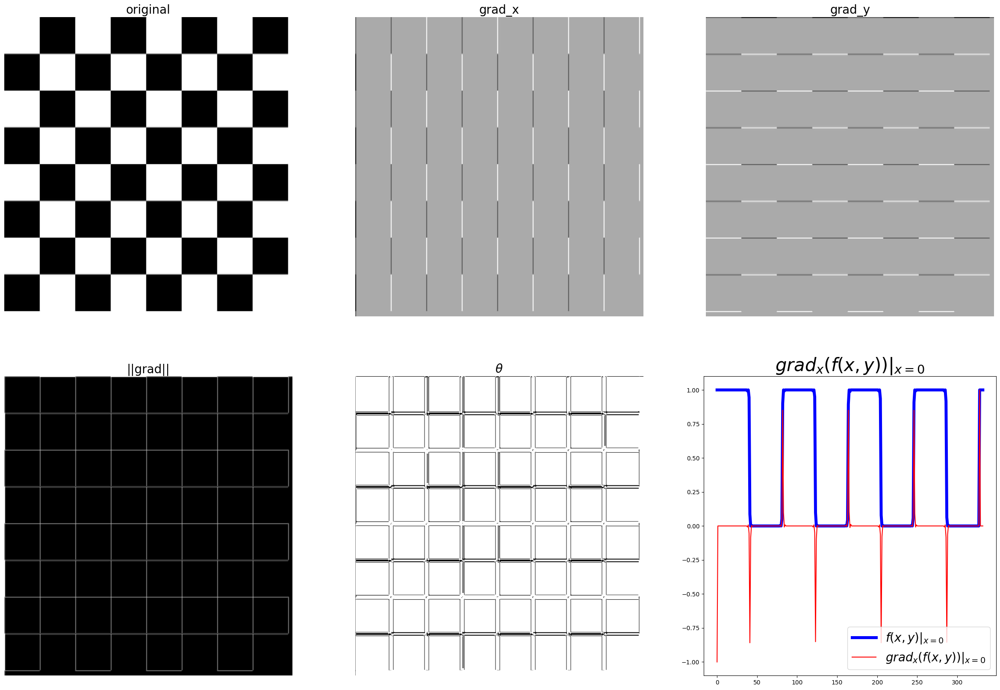

In [ ]:
im = rgb2gray(imread(path + 'chess.png')[:, :, 0:3])
ker_x = np.array([[-1, 1]])
ker_y = np.array([[-1], [1]])

def manual_convolve2d(image,kernel):
  kernel_height, kernel_width = kernel.shape
  im_height,im_width = image.shape
  pad_height = kernel_height// 2
  pad_width = kernel_width// 2
  im_pad = np.pad(image, ((pad_height, pad_height), (pad_width, pad_width)), 'constant', constant_values=2)
  im_output = np.zeros(image.shape)
  for i in range(im_height):
      for j in range(im_width):
          im_output[i, j] = np.sum(im_pad[i:i + kernel_height, j:j + kernel_width] * kernel)
  return im_output

im_x = manual_convolve2d(im,ker_x)
im_y = manual_convolve2d(im,ker_y)
print(im_x.max(),im_x.min(),im_x.mean())
print(im_y.max(),im_y.min(),im_y.mean())
im_mag = np.sqrt(im_x**2 + im_y**2)
im_dir = np.arctan(im_y/im_x)
pylab.gray()
pylab.figure(figsize=(30,20))
pylab.subplot(231), plot_image(im, 'original'), pylab.subplot(232),
plot_image(im_x, 'grad_x')
pylab.subplot(233), plot_image(im_y, 'grad_y'), pylab.subplot(234),
plot_image(im_mag, '||grad||')
pylab.subplot(235), plot_image(im_dir, r'$\theta$'), pylab.subplot(236)
pylab.plot(range(im.shape[1]), im[0,:], 'b-', label=r'$f(x,y)|_{x=0}$', linewidth=5)
pylab.plot(range(im.shape[1]), im_x[0,:], 'r-', label=r'$grad_x (f(x,y))|_{x=0}$')
pylab.title(r'$grad_x (f(x,y))|_{x=0}$', size=30)
pylab.legend(prop={'size': 20})
pylab.show()

# #Escalado de im
# im_output1 = im_output-im_output.min()
# im_output1 = im_output/im_output.max()
# print('Escalado de im: ',im_output1.max(),im_output1.min())
# #np.clip
# im_output1 = np.clip(im_output1,0,255)
# print('Usando np.clip: ',im_output1.max(),im_output1.min())

# Laplaciano

<Figure size 640x480 with 0 Axes>

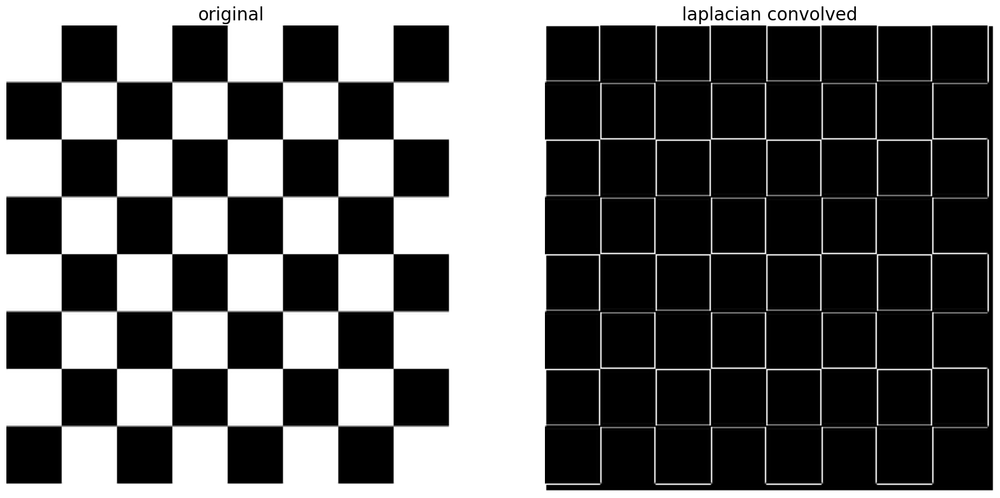

In [ ]:
ker_laplacian = [[0,-1,0],[-1, 4, -1],[0,-1,0]]
im = rgb2gray(imread(path+'chess.png')[:,:,0:3])
im1 = np.clip(signal.convolve2d(im, ker_laplacian, mode='same'),0,1)
pylab.gray()
pylab.figure(figsize=(20,10))
pylab.subplot(121), plot_image(im, 'original')
pylab.subplot(122), plot_image(im1, 'laplacian convolved')
pylab.show()

# Efectos de Ruido

1.0000000000000004


<ipython-input-39-c9ddb9e0c17f>:14: RuntimeWarning: divide by zero encountered in divide
  im_ang = np.arctan(im_y/im_x)
<ipython-input-39-c9ddb9e0c17f>:14: RuntimeWarning: invalid value encountered in divide
  im_ang = np.arctan(im_y/im_x)


<Figure size 640x480 with 0 Axes>

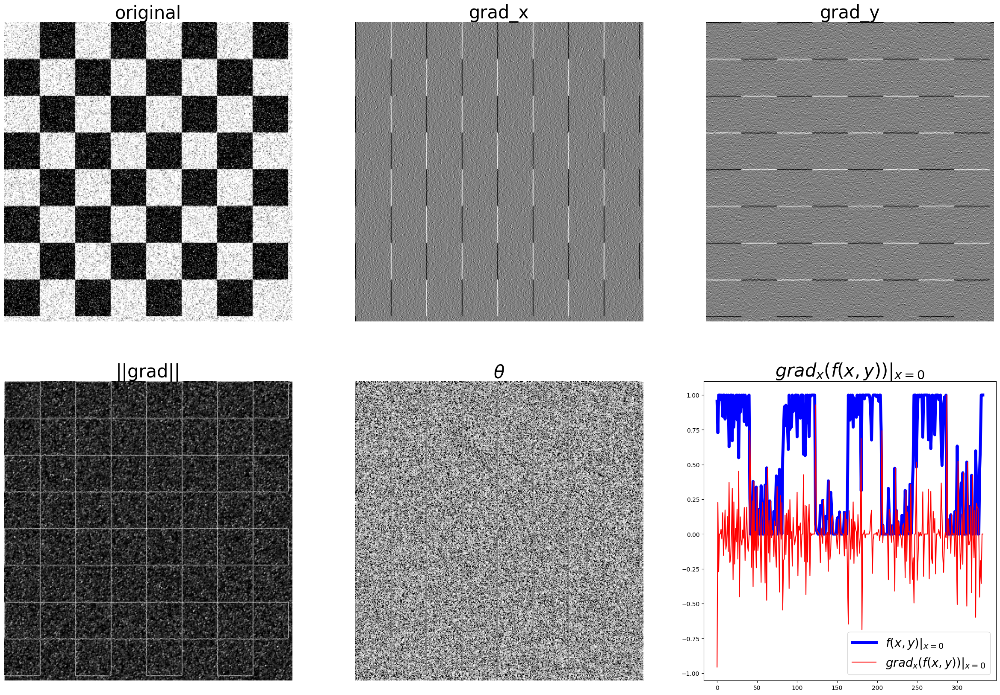

In [ ]:
ker_x = [[-1, 1]]
ker_y = [[-1], [1]]
im = rgb2gray(imread(path+'chess.png')[:,:,0:3])
sigma = 0.25
sign = np.random.random(im.shape)
sign[sign <= 0.5] = -1
sign[sign > 0.5] = 1
im = random_noise(im, var=sigma**2)
im = gaussian(im, sigma=0.25)
print(np.max(im))
im_x = signal.convolve2d(im, ker_x, mode='same')
im_y = signal.convolve2d(im, ker_y, mode='same')
im_mag = np.sqrt(im_x**2 + im_y**2)
im_ang = np.arctan(im_y/im_x)
plt.gray()
plt.figure(figsize=(30,20))
plt.subplot(231)
plt.imshow(im)
plt.title('original', size=30)
plt.axis('off')
plt.subplot(232)
plt.imshow(im_x)
plt.title('grad_x', size=30)
plt.axis('off')
plt.subplot(233)
plt.imshow(im_y)
plt.title('grad_y', size=30)
plt.axis('off')
plt.subplot(234)
plt.imshow(im_mag)
plt.title('||grad||', size=30)
plt.axis('off')
plt.subplot(235)
plt.imshow(im_ang)
plt.title(r'$\theta$', size=30)
plt.axis('off')
plt.subplot(236)
plt.plot(range(im.shape[1]), im[0,:], 'b-', label=r'$f(x,y)|_{x=0}$', linewidth=5)
plt.plot(range(im.shape[1]), im_x[0,:], 'r-', label=r'$grad_x (f(x,y))|_{x=0}$')
plt.title(r'$grad_x (f(x,y))|_{x=0}$', size=30)
plt.legend(prop={'size': 20})
plt.show()

# Filtro Laplaciano

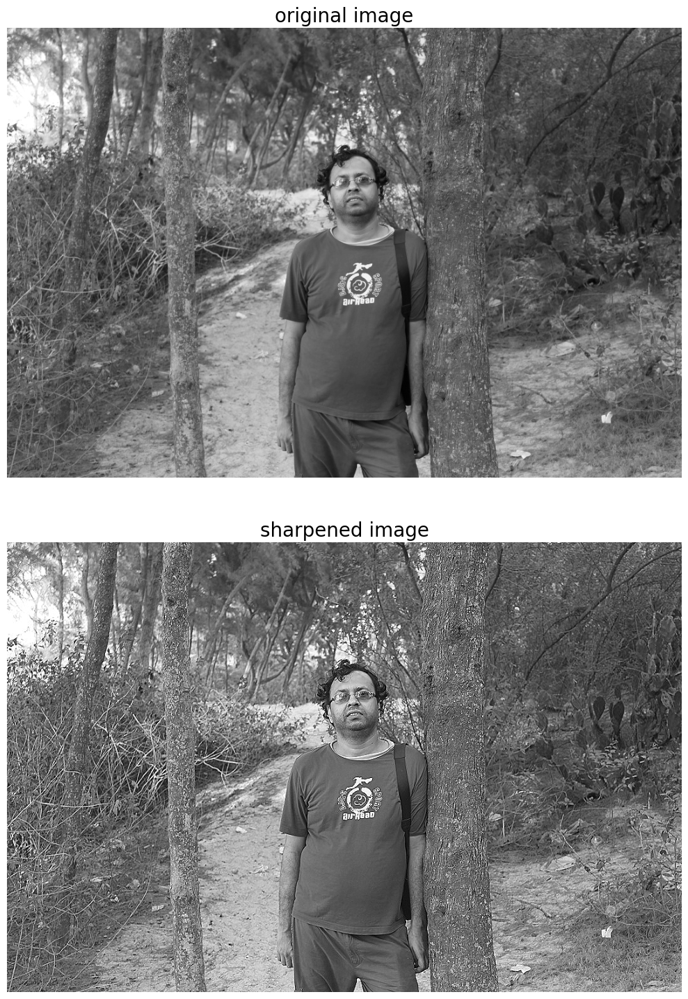

In [ ]:
im = rgb2gray(imread(path+'me8.JPG'))
im1 = np.clip(laplace(im) + im, 0, 1)
pylab.figure(figsize=(10,15))
pylab.subplot(211), plot_image(im, 'original image')
pylab.subplot(212), plot_image(im1, 'sharpened image')
pylab.tight_layout()
pylab.show()